In [1]:
#implementing a multi layer perceptron to build a character level language model
#paper link: https://www.jmlr.org/papers/volume3/bengio03a/bengio03a.pdf

In [2]:
import torch

In [3]:
words = open('names.txt', 'r').read().splitlines()

In [4]:
words

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn',
 'abigail',
 'emily',
 'elizabeth',
 'mila',
 'ella',
 'avery',
 'sofia',
 'camila',
 'aria',
 'scarlett',
 'victoria',
 'madison',
 'luna',
 'grace',
 'chloe',
 'penelope',
 'layla',
 'riley',
 'zoey',
 'nora',
 'lily',
 'eleanor',
 'hannah',
 'lillian',
 'addison',
 'aubrey',
 'ellie',
 'stella',
 'natalie',
 'zoe',
 'leah',
 'hazel',
 'violet',
 'aurora',
 'savannah',
 'audrey',
 'brooklyn',
 'bella',
 'claire',
 'skylar',
 'lucy',
 'paisley',
 'everly',
 'anna',
 'caroline',
 'nova',
 'genesis',
 'emilia',
 'kennedy',
 'samantha',
 'maya',
 'willow',
 'kinsley',
 'naomi',
 'aaliyah',
 'elena',
 'sarah',
 'ariana',
 'allison',
 'gabriella',
 'alice',
 'madelyn',
 'cora',
 'ruby',
 'eva',
 'serenity',
 'autumn',
 'adeline',
 'hailey',
 'gianna',
 'valentina',
 'isla',
 'eliana',
 'quinn',
 'nevaeh',
 'ivy',
 'sadie',
 'piper',
 'lydia',
 'alexa',
 'josephine',
 'emery',
 'julia'

In [5]:
chars = sorted(list(set(''.join(words))))

atoi = {ch: i+1 for i, ch in enumerate(chars)}
atoi['.'] = 0

itoa = {i: ch for ch, i in atoi.items()}

In [6]:
w = 'emma'
for i in w+'.':
    print(i)

e
m
m
a
.


In [7]:
#making the dataset
block_size = 3   #context length, the number of chars it needs to predict the next char
X, Y = [], []

for w in words[:5]:
    context = [0] * block_size
    print(w)
    for ch in (w+'.'):
        ix = atoi[ch]
        X.append(context)
        Y.append(ix)
        print(''.join(itoa[i] for i in context), '-->', ch)
        context = context[1:] + [ix]

X = torch.tensor(X)
Y = torch.tensor(Y)

emma
... --> e
..e --> m
.em --> m
emm --> a
mma --> .
olivia
... --> o
..o --> l
.ol --> i
oli --> v
liv --> i
ivi --> a
via --> .
ava
... --> a
..a --> v
.av --> a
ava --> .
isabella
... --> i
..i --> s
.is --> a
isa --> b
sab --> e
abe --> l
bel --> l
ell --> a
lla --> .
sophia
... --> s
..s --> o
.so --> p
sop --> h
oph --> i
phi --> a
hia --> .


In [8]:
X


tensor([[ 0,  0,  0],
        [ 0,  0,  5],
        [ 0,  5, 13],
        [ 5, 13, 13],
        [13, 13,  1],
        [ 0,  0,  0],
        [ 0,  0, 15],
        [ 0, 15, 12],
        [15, 12,  9],
        [12,  9, 22],
        [ 9, 22,  9],
        [22,  9,  1],
        [ 0,  0,  0],
        [ 0,  0,  1],
        [ 0,  1, 22],
        [ 1, 22,  1],
        [ 0,  0,  0],
        [ 0,  0,  9],
        [ 0,  9, 19],
        [ 9, 19,  1],
        [19,  1,  2],
        [ 1,  2,  5],
        [ 2,  5, 12],
        [ 5, 12, 12],
        [12, 12,  1],
        [ 0,  0,  0],
        [ 0,  0, 19],
        [ 0, 19, 15],
        [19, 15, 16],
        [15, 16,  8],
        [16,  8,  9],
        [ 8,  9,  1]])

In [9]:
Y

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

In [10]:
#making the lookup matrix
C = torch.randn([27, 2])  #since we do it at a char level, we have 27 chars to be embedded in this case
#a 2 dimenstional embedding space

In [11]:
C

tensor([[-0.0089, -0.0606],
        [ 2.1613, -0.1427],
        [ 0.7935,  0.3929],
        [-1.1540, -2.0432],
        [-0.8208, -0.2254],
        [-0.2385,  1.3600],
        [ 0.1592, -1.0426],
        [-0.8731, -1.7170],
        [-1.0060, -1.1658],
        [ 0.0210,  0.6217],
        [ 0.9608, -0.8517],
        [-0.9520, -0.8383],
        [ 0.0159,  0.6168],
        [ 1.2344, -0.3141],
        [ 0.2506,  0.8942],
        [ 1.1108,  1.7585],
        [-1.0924, -1.8239],
        [-2.0038, -0.1822],
        [-0.0192,  0.1525],
        [ 0.9563, -0.5449],
        [-1.9434, -0.6501],
        [-0.7782, -2.6628],
        [-0.5147, -0.7316],
        [ 0.4747, -0.4517],
        [ 0.8214, -1.0400],
        [ 0.3430, -0.2713],
        [-0.3986,  0.4342]])

In [12]:
#now X already has the context, we need to embed it using the lookup matrix
emb = C[X]  #flexible indexing in pytorch

In [13]:
emb.shape   #each word has a two dim embedding hence the tensor has the third dim of 2

torch.Size([32, 3, 2])

the structure of the MLP to be built, here we take three context characters

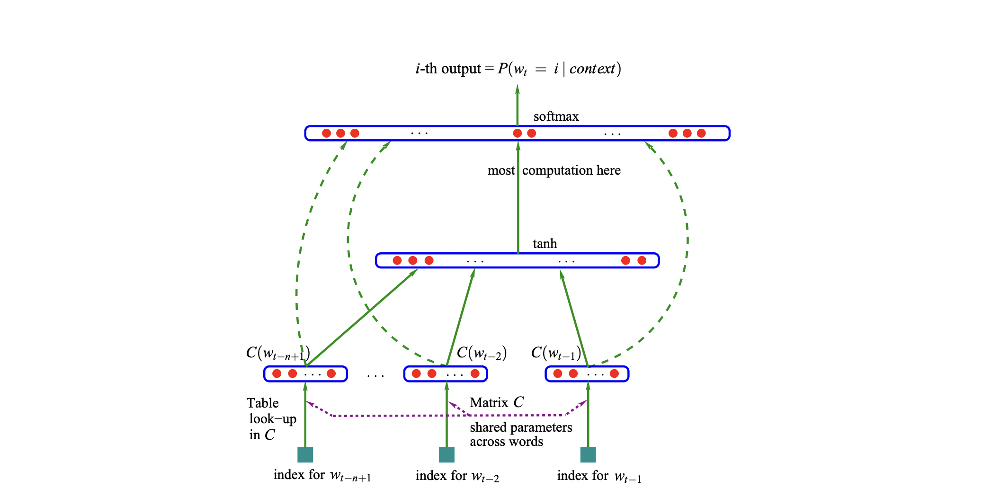

In [14]:
#defining the inner layer, which will have 100 neurons 
W1 = torch.randn([6, 100])  #3*2 is the number of input neurons, 100 is the num of output neurons, 
#hence each row in this matrix represents the weights of a neuron 
b1 = torch.randn(100)  #each neuron in the hidden layer will have a bias and it only makes sense 
#as the activation of a neuron is the sum of the products of weights connected to it from all
#the diff neurons in the previous layers and the input layer neuron's values with sum with a singular
#bias element

In [15]:
#the actual input fed into the hidden layer is the flattened version of the embedding tensor
#hence we need to flatter (32, 3, 2) to (32, 6) to be able to multiply it with the weights
emb_flattened = torch.concat(torch.unbind(emb, dim=1), dim=1)
#torch.unbind frees the tensor from the dimension specified, in this case the second dimension given 
#by 1, and then torch.concat concatenates it along dim 1

In [16]:
emb_flattened.shape

torch.Size([32, 6])

In [17]:
emb_flattened   

tensor([[-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.2385,  1.3600],
        [-0.0089, -0.0606, -0.2385,  1.3600,  1.2344, -0.3141],
        [-0.2385,  1.3600,  1.2344, -0.3141,  1.2344, -0.3141],
        [ 1.2344, -0.3141,  1.2344, -0.3141,  2.1613, -0.1427],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606,  1.1108,  1.7585],
        [-0.0089, -0.0606,  1.1108,  1.7585,  0.0159,  0.6168],
        [ 1.1108,  1.7585,  0.0159,  0.6168,  0.0210,  0.6217],
        [ 0.0159,  0.6168,  0.0210,  0.6217, -0.5147, -0.7316],
        [ 0.0210,  0.6217, -0.5147, -0.7316,  0.0210,  0.6217],
        [-0.5147, -0.7316,  0.0210,  0.6217,  2.1613, -0.1427],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606,  2.1613, -0.1427],
        [-0.0089, -0.0606,  2.1613, -0.1427, -0.5147, -0.7316],
        [ 2.1613, -0.1427, -0.5147, -0.7

In [18]:
#the same thing can be done using the view method, which just tells torch to reprsent the tensor in a
#different shape, but the underlying data remains the same
emb_flattened = emb.view(-1, 6)  #-1 indicates that the number of rows can be anything as long as the
#number of columns is 6, also it does not create new storage for 
#the tensor, it just changes the way it is represented

In [19]:
emb_flattened

tensor([[-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.2385,  1.3600],
        [-0.0089, -0.0606, -0.2385,  1.3600,  1.2344, -0.3141],
        [-0.2385,  1.3600,  1.2344, -0.3141,  1.2344, -0.3141],
        [ 1.2344, -0.3141,  1.2344, -0.3141,  2.1613, -0.1427],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606,  1.1108,  1.7585],
        [-0.0089, -0.0606,  1.1108,  1.7585,  0.0159,  0.6168],
        [ 1.1108,  1.7585,  0.0159,  0.6168,  0.0210,  0.6217],
        [ 0.0159,  0.6168,  0.0210,  0.6217, -0.5147, -0.7316],
        [ 0.0210,  0.6217, -0.5147, -0.7316,  0.0210,  0.6217],
        [-0.5147, -0.7316,  0.0210,  0.6217,  2.1613, -0.1427],
        [-0.0089, -0.0606, -0.0089, -0.0606, -0.0089, -0.0606],
        [-0.0089, -0.0606, -0.0089, -0.0606,  2.1613, -0.1427],
        [-0.0089, -0.0606,  2.1613, -0.1427, -0.5147, -0.7316],
        [ 2.1613, -0.1427, -0.5147, -0.7

In [20]:
hidden_layer = torch.tanh(emb.view(-1, 6) @ W1 + b1) 

In [21]:
W2 = torch.randn([100, 27]) #100 is the number of input neurons, 27 is the number of output neurons
b2 = torch.randn(27)

In [22]:
output_layer = hidden_layer @ W2 + b2  #logits
counts = output_layer.exp()

In [23]:
softmax_layer = counts/counts.sum(1, keepdim=True)  #normalizing the logits  
#softmax_layer's neurons now gives the prob of the each of the chars to be occuring next

In [24]:
softmax_layer

tensor([[3.1623e-01, 1.5069e-04, 7.7431e-07, 4.6457e-08, 8.6019e-04, 1.1820e-05,
         7.9546e-05, 2.9310e-01, 2.9987e-06, 3.9548e-06, 3.3391e-01, 2.7725e-08,
         4.9754e-10, 5.0875e-02, 2.6204e-06, 3.0527e-03, 7.5082e-06, 2.0973e-10,
         1.2579e-05, 3.1866e-07, 6.8362e-05, 8.1279e-10, 4.2705e-08, 1.4881e-05,
         1.6141e-03, 1.8289e-07, 6.2292e-11],
        [2.3449e-06, 3.2280e-10, 3.3686e-04, 1.2409e-10, 4.1629e-09, 9.8440e-11,
         1.1724e-06, 4.7187e-05, 1.8513e-09, 4.7820e-12, 9.9429e-01, 6.7791e-12,
         4.5654e-08, 3.3172e-04, 3.8119e-03, 1.0333e-03, 1.2191e-08, 3.8449e-06,
         1.3329e-07, 2.7919e-06, 1.6491e-08, 9.4263e-06, 3.7454e-08, 4.3349e-12,
         4.5180e-09, 1.2571e-04, 2.9466e-10],
        [2.4651e-05, 7.4552e-07, 5.0264e-10, 6.7156e-08, 4.6057e-06, 1.1366e-09,
         7.4716e-09, 8.8346e-06, 1.2104e-01, 1.2386e-06, 2.9278e-11, 1.0203e-08,
         1.9783e-13, 7.7083e-07, 3.3852e-11, 8.7891e-01, 8.4180e-11, 1.0440e-11,
         7.7140e-

In [25]:
Y

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

In [26]:
#neg log loss
nll = -softmax_layer[torch.arange(Y.shape[0]), Y].log().mean()

In [27]:
nll

tensor(14.9088)

In [259]:
#now this was all the examples for what shld be done, now doing it formally

#one more thing to point is that we dont really need to make a softmax layer, as its 
#only ever needed to find the loss and can help with visualistion of each of the chars
#occurring, so instead we can do F.cross_entropy(logits, Y) where logits is the direct
#output from the output layer wihout the softmax layer and Y is the actual tagret tensor

#using F.cross_entropy() is also better as it offsets the values of the logits 
#to let the highest value be 0, so that the exp of the logits does not explode
#so if we had [1, 2, -3, 100], normally e^100 would be inf here, but cross_entropy
#internally makes it [-99, -98, -103, 0] so that the exp of the logits does not explode
#and also the softmax remains the same as the offset is same for all the values

In [33]:
#doing it fresh
block_size = 3

def build_dataset(words):
    X, Y = [], []
    for w in words:
        context = [0] * block_size
        for ch in (w+'.'):
            ix = atoi[ch]
            X.append(context)
            Y.append(ix)
            context = context[1:] + [ix]
    X = torch.tensor(X)
    Y = torch.tensor(Y)

    return X, Y

import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))   #splitting of the datset of words, then from those split datasets we make the dataset for our use
n2 = int(0.9*len(words))

Xtr, Ytr = build_dataset(words[:n1])

Xval, Yval = build_dataset(words[n1:n2])

Xte, Yte = build_dataset(words[n2:])

In [34]:
Xtr.shape, Ytr.shape

(torch.Size([182625, 3]), torch.Size([182625]))

In [35]:
g = torch.Generator().manual_seed(2147483647)

In [36]:
C = torch.randn([27, 10], generator=g, requires_grad=True)  #the lookup matrix for the chars is differetiable too 
#bow representing the char embeddings in 10 dimesion so that each of the chars can be represented properly
W1 = torch.randn([30, 200], generator=g, requires_grad=True)
b1 = torch.rand(200, generator=g, requires_grad=True)
W2 = torch.randn([200, 27], generator=g, requires_grad=True)
b2 = torch.rand(27, generator=g, requires_grad=True)
parameters = [C, W1, b1, W2, b2]

In [37]:
#num of params to be tuned in the model
sum(p.nelement() for p in parameters)

11897

In [38]:
import torch.nn.functional as F

In [39]:
#gradient descent step
for _ in range(200000):
    #minibatch of 32 batches selected randomly
    ix = torch.randint(0, Xtr.shape[0], [32])   #selecting 32 random indices from the dataset, now doing this 
    #does reduce the quality of the graient, since the model might not be able to use the entire dataset over the 
    #span of all the epochs, but we take faster steps in doing so as opposed to having better
    # quality gradients and taking slower step, hence in practice, minibatch GD is used 
    #instead of full batch GD

    #its much faster as the update is done only for batched of 32 as opposed to that of the entire dataset all for 1000 times over
    #also here we see that the gradients bounce about a lot going from higher to lower and vice versa many times over
    #and this is just a testament to the fact that the gradients are not of the best quality, but the model still learns,
    #the steps taken in the direction of local minima are kind of random, bouncing about a lot, but its faster and does
    #still eventually learn by reaching the local minima

    #forawrd pass
    emb = C[Xtr[ix]]     #embedding the context
    h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
    logits = h @ W2 + b2
    nll = F.cross_entropy(logits, Ytr[ix])
    print(f"loss at epoch {_+1}: {nll.item()}")   #loss for just that minibatch
    
    #backward pass
    #setting all the params grads to 0 before backpropagating
    for p in parameters:
        p.grad = None
    nll.backward()  #backpropagating the loss

    #update the parameters
    lr = 0.1 if _ <100000 else 0.01
    for p in parameters: 
        p.data += -lr * p.grad

# print(nll)

loss at epoch 1: 28.790382385253906
loss at epoch 2: 30.454452514648438
loss at epoch 3: 27.100446701049805
loss at epoch 4: 23.280288696289062
loss at epoch 5: 21.83134651184082
loss at epoch 6: 26.614944458007812
loss at epoch 7: 20.94179344177246
loss at epoch 8: 25.973772048950195
loss at epoch 9: 21.934385299682617
loss at epoch 10: 20.947633743286133
loss at epoch 11: 18.689638137817383
loss at epoch 12: 21.438587188720703
loss at epoch 13: 19.336362838745117
loss at epoch 14: 16.66259002685547
loss at epoch 15: 18.054428100585938
loss at epoch 16: 19.61856460571289
loss at epoch 17: 17.3369140625
loss at epoch 18: 18.384075164794922
loss at epoch 19: 16.283859252929688
loss at epoch 20: 19.690502166748047
loss at epoch 21: 16.1202335357666
loss at epoch 22: 18.36678123474121
loss at epoch 23: 15.467188835144043
loss at epoch 24: 17.0989933013916
loss at epoch 25: 13.885531425476074
loss at epoch 26: 14.567606925964355
loss at epoch 27: 17.103002548217773
loss at epoch 28: 11.896

In [40]:
#computing the loss over the testing set
emb = C[Xte]
h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
logits = h @ W2 + b2
nll = F.cross_entropy(logits, Yte)
print(nll)

tensor(2.1566, grad_fn=<NllLossBackward0>)


In [41]:
#over validation set
emb = C[Xval]
h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
logits = h @ W2 + b2
nll = F.cross_entropy(logits, Yval)
print(nll)

tensor(2.1630, grad_fn=<NllLossBackward0>)


In [268]:
#we also ideally use three splits of the dataset, 
#training, validatiom/dev, testing

#where validation set is used to tune the hyperparameters of the model, like learning rate, number of weights in a layer etc 

#test set is used to find the final loss on new dataset and also to see what it predicts on new data

In [269]:
#a possible bottleneck to the models performance could be the number of dimensions used for embedding space, if its 
#too low, we are fitting in too much context in a low vector space so each of the chars are not properly 
#defined hence the model is not able to distinguish bw the chars and efficient training does not occur, so increasing the
#dim of the vector space could help

In [42]:
#sampling from the model
g = torch.Generator().manual_seed(2147483647 + 10)

for _ in range(20):
    out = []
    context = [0]*block_size   #init with ...

    while True:
        emb = C[torch.tensor([context])]  #embedding vector corresponding to those three chars obtained
        h = torch.tanh(emb.view(1, -1) @ W1 + b1)
        logits = h @ W2 + b2
        probs = F.softmax(logits, dim=1)
        
        ix = torch.multinomial(probs, num_samples=1, generator=g).item()
        context = context[1:] + [ix]
        out.append(ix)
        if ix==0:
            break
    
    print(''.join(itoa[i] for i in out))

carpah.
amelle.
khi.
mili.
tatyanna.
sane.
rahnen.
delynn.
jareen.
ner.
kia.
chriiv.
kaleigh.
ham.
pora.
quint.
suline.
livani.
wantho.
dearynn.


In [ ]:
#now its much more namelike